In [55]:
import pandas as pd
import numpy as np

In [81]:
df = pd.read_csv('../data/africa_merged_dataset_nasa_power.csv', index_col=False)

In [82]:
df.shape

(1401224, 8)

In [83]:
df.head()

,lat,long,population,iso3_code,corruption_perception_index,conflict_intensity,solar,wind_speed
0,37.583333,8.916667,12.795480,TUN,44,1345,201.144531,6.671875
1,37.583333,8.958333,0.047371,TUN,44,1345,201.144531,6.671875
2,37.541667,8.833333,1.305495,TUN,44,1345,201.144531,6.671875
3,37.541667,8.875000,139.428800,TUN,44,1345,201.144531,6.671875
4,37.541667,8.916667,387.129000,TUN,44,1345,201.144531,6.671875


In [84]:
df.describe()

,lat,long,population,corruption_perception_index,conflict_intensity,solar,wind_speed
count,1.401224e+06,1.401224e+06,1.401224e+06,1.401224e+06,1.401224e+06,1.401224e+06,1.401224e+06
mean,5.945374e+00,1.811667e+01,9.660898e+02,2.917440e+01,2.012267e+03,2.435890e+02,5.155363e+00
std,1.747513e+01,1.558964e+01,6.872906e+03,1.007311e+01,2.701912e+03,2.423220e+01,1.352548e+00
min,-3.483333e+01,-1.758333e+01,1.723032e-06,1.100000e+01,1.100000e+01,1.624570e+02,1.433594e+00
25%,-7.750000e+00,6.791667e+00,1.744021e+01,2.000000e+01,5.340000e+02,2.289805e+02,4.402344e+00
50%,9.000000e+00,1.975000e+01,1.645836e+02,2.900000e+01,1.345000e+03,2.473359e+02,5.503906e+00
75%,1.937500e+01,2.983333e+01,6.429550e+02,3.400000e+01,2.143000e+03,2.621484e+02,6.085938e+00
max,3.758333e+01,6.350000e+01,1.172177e+06,7.000000e+01,1.463300e+04,2.855977e+02,9.480469e+00


In [85]:
df = df.dropna()
len(df)

1401224

In [86]:
df.head()

,lat,long,population,iso3_code,corruption_perception_index,conflict_intensity,solar,wind_speed
0,37.583333,8.916667,12.795480,TUN,44,1345,201.144531,6.671875
1,37.583333,8.958333,0.047371,TUN,44,1345,201.144531,6.671875
2,37.541667,8.833333,1.305495,TUN,44,1345,201.144531,6.671875
3,37.541667,8.875000,139.428800,TUN,44,1345,201.144531,6.671875
4,37.541667,8.916667,387.129000,TUN,44,1345,201.144531,6.671875


# CLUSTERING!!!

#  KMEANS

In [87]:
from sklearn import preprocessing, cluster, compose

import geopandas as gpd
import seaborn as sns
import matplotlib.pyplot as plt

import scipy

import plotly.express as px
import plotly.graph_objs as go

In [88]:
SEED = 7

In [89]:
scaled_features = df.copy()

colsToScale = ['population', 'wind_speed', 'solar', 'conflict_intensity', 'corruption_perception_index']

# Scale data accordingly prior to clustering
features = scaled_features[colsToScale]
scale = preprocessing.StandardScaler().fit(scaled_features[colsToScale].values)
features = scale.transform(features.values)
features

array([[-0.13870329,  1.12122627, -1.75157245, -0.24696094,  1.47179979],
       [-0.14055812,  1.12122627, -1.75157245, -0.24696094,  1.47179979],
       [-0.14037507,  1.12122627, -1.75157245, -0.24696094,  1.47179979],
       ...,
       [-0.13757274,  0.38765682, -0.14988057, -0.71514805,  0.87615449],
       [-0.13796536,  0.38765682, -0.14988057, -0.71514805,  0.87615449],
       [-0.13796536,  0.38765682, -0.50242688, -0.71514805,  0.87615449]])

In [90]:
df[colsToScale] = features
df.describe()

,lat,long,population,corruption_perception_index,conflict_intensity,solar,wind_speed
count,1.401224e+06,1.401224e+06,1.401224e+06,1.401224e+06,1.401224e+06,1.401224e+06,1.401224e+06
mean,5.945374e+00,1.811667e+01,9.685619e-17,-8.932848e-17,-1.817806e-16,4.820067e-16,-3.999397e-17
std,1.747513e+01,1.558964e+01,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
min,-3.483333e+01,-1.758333e+01,-1.405650e-01,-1.804249e+00,-7.406855e-01,-3.348106e+00,-2.751674e+00
25%,-7.750000e+00,6.791667e+00,-1.380275e-01,-9.107814e-01,-5.471188e-01,-6.028550e-01,-5.567416e-01
50%,9.000000e+00,1.975000e+01,-1.166183e-01,-1.731346e-02,-2.469609e-01,1.546279e-01,2.576937e-01
75%,1.937500e+01,2.983333e+01,-4.701577e-02,4.790576e-01,4.838555e-02,7.659016e-01,6.880160e-01
max,3.758333e+01,6.350000e+01,1.704099e+02,4.052929e+00,4.671039e+00,1.733590e+00,3.197748e+00


In [91]:
fig = px.scatter_matrix(df[['population', 'wind_speed', 'solar', 'corruption_perception_index', 'conflict_intensity']]
                        .sample(100000), title="Scatter Plots of Features")
fig.update_layout(title_x=0.5)

In [92]:
data = df[['population', 'wind_speed', 'solar', 'corruption_perception_index', 'conflict_intensity']]
max_k = 10
## iterations
distortions = []
for i in range(1, max_k+1):
    if len(data) >= i:
       model = cluster.KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=SEED)
       model.fit(data)
       distortions.append(model.inertia_)

## best k: the lowest derivative
k = [i*100 for i in np.diff(distortions,2)].index(min([i*100 for i 
     in np.diff(distortions,2)]))



In [93]:
distortions

[7006119.999999976,
 5295477.2165739,
 4250334.677743282,
 3407286.2871153834,
 2704750.438296424,
 2365161.7171378518,
 2081940.574511556,
 1801207.4301634207,
 1597961.7778124749,
 1484297.7931803726]

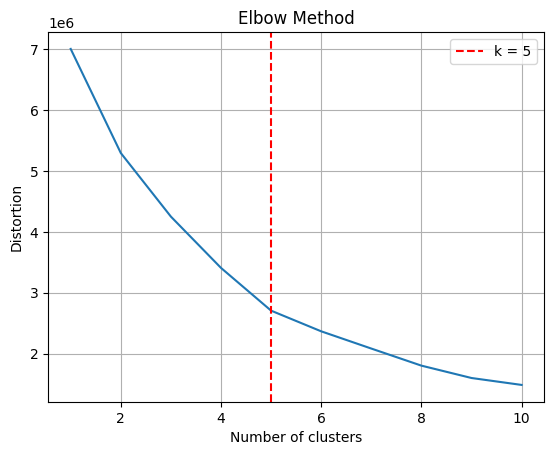

In [94]:
## plot
fig, ax = plt.subplots()
ax.plot(range(1, len(distortions)+1), distortions)
ax.axvline(k, ls='--', color="red", label="k = "+str(k))
ax.set(title='Elbow Method', xlabel='Number of clusters', 
       ylabel="Distortion")
ax.legend()
ax.grid(True)


In [95]:
k = 5

# Apply optimal k and assign cluster number to each data point
model = cluster.KMeans(n_clusters=k)
data = df[['population', 'wind_speed', 'solar', 'corruption_perception_index', 'conflict_intensity']]

df_kmeans = data.copy()
df_kmeans['cluster'] = model.fit_predict(data[['population', 'wind_speed', 'solar', 'corruption_perception_index', 'conflict_intensity']])


df[["kmeans_label"]] = df_kmeans[["cluster"]]
df['kmeans_label'].value_counts()

2    639052
0    416725
3    300362
1     44588
4       497
Name: kmeans_label, dtype: int64

In [96]:
model.cluster_centers_

array([[ 1.80123535e-02,  1.19322073e-01, -1.25478404e-02,
         1.15717729e+00, -2.53543378e-01],
       [ 5.21277384e-01, -4.78823252e-01, -7.62022159e-01,
        -5.13693451e-01,  4.67005813e+00],
       [-9.74001877e-02,  6.29172003e-01,  6.77828169e-01,
        -5.19582570e-01,  1.63994710e-02],
       [ 4.19463550e-02, -1.43260748e+00, -1.31016977e+00,
        -4.24321820e-01, -3.77063337e-01],
       [ 3.80196774e+01, -2.96780596e-01, -8.77649320e-01,
         3.42630480e-01,  4.11862519e-01]])

In [97]:
# Un-scaled centroids: population, wind_speed, solar
kmeans_centers = scale.inverse_transform(model.cluster_centers_)
for i, center in enumerate(kmeans_centers):
    
    print(f"Centroid {i}:  Population: {center[0]:.3f}  Wind Speed: {center[1]:.3f}   Solar: {center[2]:.3f} CPI: {center[3]:.3f} Conflict Intensity: {center[4]:.3f}")

Centroid 0:  Population: 1089.887  Wind Speed: 5.317   Solar: 243.285 CPI: 5138.857 Conflict Intensity: 26.620
Centroid 1:  Population: 4548.779  Wind Speed: 4.508   Solar: 225.124 CPI: 624.312 Conflict Intensity: 76.216
Centroid 2:  Population: 296.668  Wind Speed: 6.006   Solar: 260.014 CPI: 608.401 Conflict Intensity: 29.340
Centroid 3:  Population: 1254.383  Wind Speed: 3.218   Solar: 211.841 CPI: 865.787 Conflict Intensity: 25.376
Centroid 4:  Population: 262271.676  Wind Speed: 4.754   Solar: 222.322 CPI: 2938.024 Conflict Intensity: 33.323


In [98]:
clusterToCount = dict(df_kmeans['cluster'].value_counts())
smallestClassSize = min(clusterToCount.values())
largestClassSize = max(clusterToCount.values())
clusterToCount

{2: 639052, 0: 416725, 3: 300362, 1: 44588, 4: 497}

In [99]:
countDf = pd.DataFrame(clusterToCount, index=[0]).transpose().rename(columns={0: 'count'}).reset_index().sort_values('count')
countDf.rename(columns={'index': 'cluster'}, inplace=True)
px.bar(countDf, x='cluster', y='count')

In [100]:
df['weight'] = df.apply(lambda row: clusterToCount[row['kmeans_label']], axis=1)

/usr/local/lib/python3.7/site-packages/geopandas/plotting.py:51: ShapelyDeprecationWarning:

The 'type' attribute is deprecated, and will be removed in the future. You can use the 'geom_type' attribute instead.



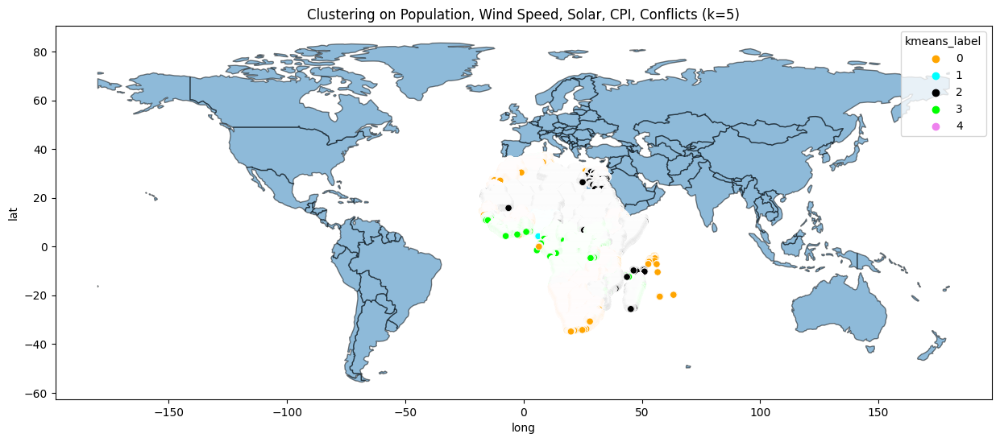

In [101]:
map = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
map = map[map.name != 'Antarctica']

ax = map.plot(alpha=0.5, edgecolor='black', figsize=(15, 10))


# Ensure that the displayed sample is representative
sample = df.groupby(by='kmeans_label').apply(lambda group: group.sample(smallestClassSize))
kmeans_colors = ['orange', 'cyan', 'black', 'lime', 'violet']

sns.scatterplot(x="long", y="lat", data=df, 
                palette=kmeans_colors,
                hue='kmeans_label', size_order=[1,0],
                legend="brief", ax=ax).set_title('Clustering on Population, Wind Speed, Solar, CPI, Conflicts (k='+str(k)+')')
plt.show()

In [104]:
df.sample(5)
df.to_csv('../data/kmeans_dataset.csv')

In [105]:
# Centroid analysis
df_kmeans_centers= pd.DataFrame(kmeans_centers).reset_index()
df_kmeans_centers.columns = ['cluster', 'population', 'wind speed', 'solar', 'corruption_perception_index', 'conflict_intensity']
df_kmeans_centers['color'] = kmeans_colors

df_kmeans_table = df_kmeans_centers[['cluster', 'color']].copy()
df_kmeans_table['pop_rank'] = [i + 1 for i in df_kmeans_centers['population'].sort_values(ascending=False).reset_index().sort_values(by='index').index]
df_kmeans_table['wind_rank'] = [i + 1 for i in df_kmeans_centers['wind speed'].sort_values(ascending=False).reset_index().sort_values(by='index').index]
df_kmeans_table['solar_rank'] = [i + 1 for i in df_kmeans_centers['solar'].sort_values(ascending=False).reset_index().sort_values(by='index').index]
df_kmeans_table['cpi_rank'] = [i + 1 for i in df_kmeans_centers['corruption_perception_index'].sort_values(ascending=False).reset_index().sort_values(by='index').index]
df_kmeans_table['conflict_rank'] = [i + 1 for i in df_kmeans_centers['conflict_intensity'].sort_values(ascending=False).reset_index().sort_values(by='index').index]

fig = go.Figure(data=[go.Table(
    header=dict(values=df_kmeans_table.columns,
                align='left'),
    cells=dict(values=[df_kmeans_table[column] for column in df_kmeans_table.columns],
               align='left'))
])
fig

# BIRCH

In [106]:
birch_model = cluster.Birch(n_clusters=None, threshold=1.5)

In [109]:
birch_model.fit(df[['population', 'wind_speed', 'solar', 'corruption_perception_index', 'conflict_intensity']].values)

Birch(n_clusters=None, threshold=1.5)

In [110]:
df['birch_label'] = birch_model.labels_

In [126]:
# Only keep clusters with large enough size
birch_label_by_count = df.groupby(by='birch_label').agg(count=('birch_label', 'count')).reset_index()
birch_label_by_count = birch_label_by_count[birch_label_by_count['count'] >= 80000]
validLabels = sorted(list(birch_label_by_count['birch_label']))
len(validLabels)

5

/usr/local/lib/python3.7/site-packages/geopandas/plotting.py:51: ShapelyDeprecationWarning:

The 'type' attribute is deprecated, and will be removed in the future. You can use the 'geom_type' attribute instead.

/Users/julianlioanag/Library/Python/3.7/lib/python/site-packages/ipykernel_launcher.py:14: UserWarning:

The palette list has more values (6) than needed (5), which may not be intended.



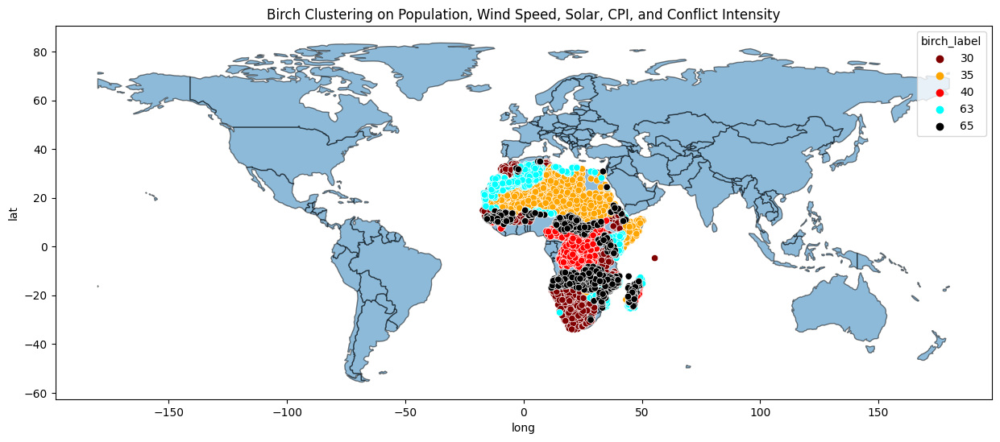

In [127]:
map = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
map = map[map.name != 'Antarctica']

ax = map.plot(alpha=0.5, edgecolor='black', figsize=(15, 10))

# Ensure that the displayed sample is representative of each cluster
sample = df.groupby(by='birch_label').apply(lambda group: group.sample(0) if group.name not in validLabels else group.sample(1000))

birch_colors = ['maroon', 'orange', 'red', 'cyan', 'black', 'lime']

sns.scatterplot(x="long", y="lat", data=sample, 
                palette=birch_colors,
                hue='birch_label', size_order=[1,0],
                legend="brief", ax=ax).set_title('Birch Clustering on Population, Wind Speed, Solar, CPI, and Conflict Intensity')
plt.show()

In [128]:
birch_centers = scale.inverse_transform(birch_model.subcluster_centers_)
birch_centers = birch_centers[validLabels, ]
for i, center in zip(validLabels, birch_centers):
    print(f"Center {i}:  Population: {center[0]:.3f}  Wind Speed: {center[1]:.3f}   Solar: {center[2]:.3f}")


Center 30:  Population: 736.034  Wind Speed: 5.190   Solar: 246.301
Center 35:  Population: 278.753  Wind Speed: 6.024   Solar: 260.227
Center 40:  Population: 738.366  Wind Speed: 2.946   Solar: 211.737
Center 63:  Population: 512.535  Wind Speed: 6.444   Solar: 239.731
Center 65:  Population: 597.314  Wind Speed: 4.861   Solar: 238.917


In [129]:
# Centroid analysis
df_birch_centers= pd.DataFrame(birch_centers).reset_index()
df_birch_centers.columns = ['cluster', 'population', 'wind speed', 'solar', 'corruption_perception_index', 'conflict_intensity']
df_birch_centers['color'] = kmeans_colors

df_birch_table = df_birch_centers[['cluster', 'color']].copy()
df_birch_table['pop_rank'] = [i + 1 for i in df_birch_centers['population'].sort_values(ascending=False).reset_index().sort_values(by='index').index]
df_birch_table['wind_rank'] = [i + 1 for i in df_birch_centers['wind speed'].sort_values(ascending=False).reset_index().sort_values(by='index').index]
df_birch_table['solar_rank'] = [i + 1 for i in df_birch_centers['solar'].sort_values(ascending=False).reset_index().sort_values(by='index').index]
df_birch_table['cpi_rank'] = [i + 1 for i in df_birch_centers['corruption_perception_index'].sort_values(ascending=False).reset_index().sort_values(by='index').index]
df_birch_table['conflict_rank'] = [i + 1 for i in df_birch_centers['conflict_intensity'].sort_values(ascending=False).reset_index().sort_values(by='index').index]


df_birch_centers
fig = go.Figure(data=[go.Table(
    header=dict(values=df_birch_table.columns,
                align='left'),
    cells=dict(values=[df_birch_table[column] for column in df_birch_table.columns],
               align='left'))
])
fig

In [130]:
df.sample(10)

,lat,long,population,iso3_code,corruption_perception_index,conflict_intensity,solar,wind_speed,kmeans_label,weight,birch_label
467940,18.083333,36.208333,-0.097524,SDN,-0.910781,1.273814,1.004962,0.526284,2,639052,35
787516,7.416667,21.708333,-0.116265,CAF,-0.513685,-0.570066,-0.544500,-0.637608,3,300362,65
495920,14.166667,23.708333,-0.016642,SDN,-0.910781,1.273814,1.352995,0.526284,2,639052,35
1144826,-13.500000,26.666667,-0.127430,ZMB,0.379783,-0.701454,-0.062510,0.191268,0,416725,65
545191,18.208333,7.791667,-0.134251,NER,0.181235,-0.497524,1.166163,0.237477,2,639052,35
53525,28.708333,3.083333,-0.138162,DZA,0.379783,-0.063757,0.468647,1.329167,2,639052,63
303860,16.250000,1.250000,-0.132388,MLI,-0.017313,-0.032298,0.826513,0.549389,2,639052,35
449405,20.916667,26.291667,-0.139592,SDN,-0.910781,1.273814,1.448910,0.630255,2,639052,35
110729,34.291667,-2.125000,-0.114951,MAR,0.975429,-0.429424,-0.687002,-0.008009,0,416725,64
1276786,-26.625000,19.375000,-0.140309,NAM,1.968171,-0.558962,1.191794,0.506068,0,416725,30


In [ ]:
df.to_csv('../data/cluster_label_for_dataset.csv')